## This file aims to forecast citi bike rentals using a dataset spanning from 2019 to 2024.

## Import necessary Libraries

In [1]:
#install necessary packages
!pip install seaborn
!pip install prophet
!pip install scikit-learn
!pip install plotly
!pip install ipywidgets

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
ERROR: unknown command "install scikit-learn"
Defaulting to user installation because normal site-packages is not writeable
ERROR: unknown command "install ipywidgets"


In [2]:
# importing required libraries
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from datetime import datetime
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
from pyspark.sql.functions import col, count, date_format, to_date, year, unix_timestamp, round, avg, sum, hour, dayofweek, lit
from pyspark.sql.types import StructType, StructField, StringType, DecimalType, BooleanType, FloatType, DoubleType, TimestampType, IntegerType

sns.set_style('whitegrid')

In [3]:
!echo $SPARK_MASTER_ADDRESS

spark://notch308.ipoib.int.chpc.utah.edu:7079


In [4]:
!echo $SPARK_MASTER_OOD_ADDRESS
!echo $SPARK_WORKER1_OOD_ADDRESS
!echo $SPARK_WORKER2_OOD_ADDRESS

https://ondemand-class.chpc.utah.edu/rnode/notch308.ipoib.int.chpc.utah.edu/8084
https://ondemand-class.chpc.utah.edu/rnode/notch308.ipoib.int.chpc.utah.edu/8085
https://ondemand-class.chpc.utah.edu/rnode/notch309.ipoib.int.chpc.utah.edu/8083


In [5]:
from pyspark.sql import SparkSession
import os
spark = SparkSession.builder \
    .master(os.getenv('SPARK_MASTER_ADDRESS')) \
    .appName("Spark-application") \
    .getOrCreate()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/04/30 18:00:20 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


### Manual inspection of dataset for each year from 2019-2024

In [6]:
directory_path = "data/5_years"

# Get a list of all CSV files in the directory
csv_files = [os.path.join(directory_path, file) for file in os.listdir(directory_path) if file.endswith(".csv")]

In [7]:
data_2019 = 'data/5_years/JC-201901-citibike-tripdata.csv'
data_2020 = 'data/5_years/JC-202001-citibike-tripdata.csv'
data_2021 = 'data/5_years/JC-202101-citibike-tripdata.csv'
data_2022 = 'data/5_years/JC-202201-citibike-tripdata.csv'
data_2023 = 'data/5_years/JC-202301-citibike-tripdata.csv'
data_2024 = 'data/5_years/JC-202401-citibike-tripdata.csv'

data_years = [data_2019, data_2020, data_2021, data_2022, data_2023, data_2024]
for years in data_years:
    objects = spark.read.csv(years, sep=',',inferSchema=True, header=True)
    print(years)
    objects.printSchema()

data/5_years/JC-201901-citibike-tripdata.csv
root
 |-- tripduration: integer (nullable = true)
 |-- starttime: timestamp (nullable = true)
 |-- stoptime: timestamp (nullable = true)
 |-- start station id: integer (nullable = true)
 |-- start station name: string (nullable = true)
 |-- start station latitude: double (nullable = true)
 |-- start station longitude: double (nullable = true)
 |-- end station id: integer (nullable = true)
 |-- end station name: string (nullable = true)
 |-- end station latitude: double (nullable = true)
 |-- end station longitude: double (nullable = true)
 |-- bikeid: integer (nullable = true)
 |-- usertype: string (nullable = true)
 |-- birth year: integer (nullable = true)
 |-- gender: integer (nullable = true)



data/5_years/JC-202001-citibike-tripdata.csv
root
 |-- tripduration: integer (nullable = true)
 |-- starttime: timestamp (nullable = true)
 |-- stoptime: timestamp (nullable = true)
 |-- start station id: integer (nullable = true)
 |-- start station name: string (nullable = true)
 |-- start station latitude: double (nullable = true)
 |-- start station longitude: double (nullable = true)
 |-- end station id: integer (nullable = true)
 |-- end station name: string (nullable = true)
 |-- end station latitude: double (nullable = true)
 |-- end station longitude: double (nullable = true)
 |-- bikeid: integer (nullable = true)
 |-- usertype: string (nullable = true)
 |-- birth year: integer (nullable = true)
 |-- gender: integer (nullable = true)

data/5_years/JC-202101-citibike-tripdata.csv
root
 |-- tripduration: integer (nullable = true)
 |-- starttime: timestamp (nullable = true)
 |-- stoptime: timestamp (nullable = true)
 |-- start station id: integer (nullable = true)
 |-- start statio

data/5_years/JC-202301-citibike-tripdata.csv
root
 |-- ride_id: string (nullable = true)
 |-- rideable_type: string (nullable = true)
 |-- started_at: timestamp (nullable = true)
 |-- ended_at: timestamp (nullable = true)
 |-- start_station_name: string (nullable = true)
 |-- start_station_id: string (nullable = true)
 |-- end_station_name: string (nullable = true)
 |-- end_station_id: string (nullable = true)
 |-- start_lat: double (nullable = true)
 |-- start_lng: double (nullable = true)
 |-- end_lat: double (nullable = true)
 |-- end_lng: double (nullable = true)
 |-- member_casual: string (nullable = true)

data/5_years/JC-202401-citibike-tripdata.csv
root
 |-- ride_id: string (nullable = true)
 |-- rideable_type: string (nullable = true)
 |-- started_at: timestamp (nullable = true)
 |-- ended_at: timestamp (nullable = true)
 |-- start_station_name: string (nullable = true)
 |-- start_station_id: string (nullable = true)
 |-- end_station_name: string (nullable = true)
 |-- end_sta

#### As we can see the dataset in inconsistent in column names. Hence, we need some data preprocessing before preparing our final merged dataset.

#### Identical columns as per need: {"starttime" : "started_at", "start station name" : "start_station_name", "end station name" : "end_station_name", start station latitude", "start_lat","end station latitude", "end_lat", "start station longitude", "start_lng" , "end station longitude", "end_lng"}

#### After preprocessing, We created a merged dataframe by merging all the csv present in our dataset. We have also done feature engineering so that we only consider those column which is needed for our task.

In [8]:
start_time = datetime.now()

# Read the first CSV file to create the initial DataFrame
objects = spark.read.csv(csv_files[0], header=True, inferSchema=True)

# Rename the files to make them consistent
objects = objects.withColumnRenamed("starttime", "started_at") \
                 .withColumnRenamed("stoptime", "ended_at") \
                 .withColumnRenamed("start station name", "start_station_name") \
                 .withColumnRenamed("end station name", "end_station_name") \
                 .withColumnRenamed("start station latitude", "start_lat") \
                 .withColumnRenamed("end station latitude", "end_lat") \
                 .withColumnRenamed("start station longitude", "start_lng") \
                 .withColumnRenamed("end station longitude", "end_lng") 

# Feature engineering to select only need columns
objects=objects.select("started_at","ended_at","start_station_name","end_station_name","start_lat","start_lng","end_lat","end_lng")

# Loop through the remaining CSV files and union them with the initial DataFrame
for file in csv_files[1:]:
    objects_temp = spark.read.csv(file, header=True, inferSchema=True)

    # Rename the files to make them consistent
    objects_temp = objects_temp.withColumnRenamed("starttime", "started_at") \
                 .withColumnRenamed("stoptime", "ended_at") \
                 .withColumnRenamed("start station name", "start_station_name") \
                 .withColumnRenamed("end station name", "end_station_name") \
                 .withColumnRenamed("start station latitude", "start_lat") \
                 .withColumnRenamed("end station latitude", "end_lat") \
                 .withColumnRenamed("start station longitude", "start_lng") \
                 .withColumnRenamed("end station longitude", "end_lng") 

    # Feature engineering to select only need columns
    objects_temp=objects_temp.select("started_at","ended_at","start_station_name","end_station_name","start_lat","start_lng","end_lat","end_lng")

    #Merging the dataframe
    objects = objects.union(objects_temp)

end_time = datetime.now()

# Show the merged dataframe
objects.show()

+--------------------+--------------------+------------------+--------------------+----------+-----------+-----------------+------------------+
|          started_at|            ended_at|start_station_name|    end_station_name| start_lat|  start_lng|          end_lat|           end_lng|
+--------------------+--------------------+------------------+--------------------+----------+-----------+-----------------+------------------+
|2019-01-01 03:09:...|2019-01-01 03:12:...|    Exchange Place|    Essex Light Rail|40.7162469|-74.0334588|       40.7127742|       -74.0364857|
|2019-01-01 05:18:...|2019-01-01 05:26:...|    Exchange Place|       Washington St|40.7162469|-74.0334588|       40.7242941|       -74.0354826|
|2019-01-01 10:36:...|2019-01-01 10:49:...|    Exchange Place|  Liberty Light Rail|40.7162469|-74.0334588|       40.7112423|       -74.0557013|
|2019-01-01 12:43:...|2019-01-01 13:09:...|    Exchange Place|       Washington St|40.7162469|-74.0334588|       40.7242941|       -74.0

In [9]:
# Time required for data preprocessing and preparing the datafram
print("Time required for data preparation", (end_time - start_time))

Time required for data preparation 0:00:27.623460


In [10]:
objects.printSchema()

# Display the count of records
print("Number of records:", objects.count())

root
 |-- started_at: timestamp (nullable = true)
 |-- ended_at: timestamp (nullable = true)
 |-- start_station_name: string (nullable = true)
 |-- end_station_name: string (nullable = true)
 |-- start_lat: double (nullable = true)
 |-- start_lng: double (nullable = true)
 |-- end_lat: double (nullable = true)
 |-- end_lng: double (nullable = true)



Number of records: 3376802


### Data Cleaning:

#### We check for null values in our dataframe and remove those records from dataframe.

In [11]:
start_time = datetime.now()

null_counts_per_column = {}

# Iterate over each column and count null values
for column in objects.columns:
    null_count = objects.filter(col(column).isNull()).count()
    null_counts_per_column[column] = null_count

for column, cnt in null_counts_per_column.items():
    print(f"Column '{column}': {cnt} null values")

Column 'started_at': 0 null values
Column 'ended_at': 0 null values
Column 'start_station_name': 102 null values
Column 'end_station_name': 10319 null values
Column 'start_lat': 0 null values
Column 'start_lng': 0 null values
Column 'end_lat': 5193 null values
Column 'end_lng': 5193 null values


In [12]:
objects = objects.dropna()   # drop null values if any

print("Number of records after data cleaning:", objects.count())

Number of records after data cleaning: 3366463


#### Next, We calculate the duration of each ride in seconds by taking time difference between started_at time and ended_at time. We further ignore those rides having a ride duration less than a minute to ensure the accuracy and relevance of the analysis, as very short durations might not provide meaningful insights into bike usage patterns or user behavior.

In [13]:
# Convert 'started_at' and 'ended_at' columns to timestamps
objects = objects.withColumn('started_at', unix_timestamp(col('started_at'), 'yyyy-MM-dd HH:mm:ss').cast("timestamp"))
objects = objects.withColumn('ended_at', unix_timestamp(col('ended_at'), 'yyyy-MM-dd HH:mm:ss').cast("timestamp"))

# Calculate duration of each ride in seconds
objects = objects.withColumn('total_ride_duration_seconds', (col('ended_at').cast('long') - col('started_at').cast('long')))

objects.show()

+-------------------+-------------------+------------------+--------------------+----------+-----------+-----------------+------------------+---------------------------+
|         started_at|           ended_at|start_station_name|    end_station_name| start_lat|  start_lng|          end_lat|           end_lng|total_ride_duration_seconds|
+-------------------+-------------------+------------------+--------------------+----------+-----------+-----------------+------------------+---------------------------+
|2019-01-01 03:09:09|2019-01-01 03:12:30|    Exchange Place|    Essex Light Rail|40.7162469|-74.0334588|       40.7127742|       -74.0364857|                        201|
|2019-01-01 05:18:00|2019-01-01 05:26:25|    Exchange Place|       Washington St|40.7162469|-74.0334588|       40.7242941|       -74.0354826|                        505|
|2019-01-01 10:36:33|2019-01-01 10:49:10|    Exchange Place|  Liberty Light Rail|40.7162469|-74.0334588|       40.7112423|       -74.0557013|         

In [14]:
# # Filter records with less than 1 minute duration and ignore this rides
# short_duration_rides = objects.filter(col('total_ride_duration_seconds') < 60)
# short_duration_rides.count()

In [15]:
# cosidering only ride having total_ride_duration_seconds > 1 min (60 sec) 
objects = objects.filter(col('total_ride_duration_seconds') >= 60)
objects.count()

3309552

In [16]:
end_time = datetime.now()

In [17]:
# Time required for data preprocessing and preparing the datafram
print("Time required for data cleaning:", (end_time - start_time))

Time required for data cleaning: 0:01:24.432421


# Exploratory data analysis

In this section, We address key inquiries posed by Citi Bike such as 
1. Where do Citi Bikers ride? 
2. When do they ride? 
3. How far do they go?
4. Which stations are most popular? 
5. What days of the week are most rides taken on?

## 1. Where do Citi Bikers ride? (Popular start and end stations)

In [18]:
start_time = datetime.now()

In [19]:
# We group by start station name and count the number of rides
start_station_counts = objects.groupBy('start_station_name').count().orderBy('count', ascending=False)

# We group by end station name and count the number of rides
end_station_counts = objects.groupBy('end_station_name').count().orderBy('count', ascending=False)

start_station_counts.show(10)   # top 10 starting stations
end_station_counts.show(10)     # top 10 ending stations

+--------------------+------+
|  start_station_name| count|
+--------------------+------+
|       Grove St PATH|189725|
|       Hamilton Park|100845|
|Hoboken Terminal ...| 98216|
|        Newport Pkwy| 95772|
|        Newport PATH| 92838|
|South Waterfront ...| 91683|
|    Marin Light Rail| 81822|
|Hoboken Terminal ...| 78547|
|          Harborside| 76942|
|  Liberty Light Rail| 70154|
+--------------------+------+
only showing top 10 rows



+--------------------+------+
|    end_station_name| count|
+--------------------+------+
|       Grove St PATH|215096|
|       Hamilton Park| 99721|
|        Newport Pkwy| 96176|
|Hoboken Terminal ...| 95092|
|        Newport PATH| 93611|
|South Waterfront ...| 93005|
|Hoboken Terminal ...| 81239|
|    Marin Light Rail| 81224|
|          Harborside| 76957|
|  Liberty Light Rail| 71860|
+--------------------+------+
only showing top 10 rows



## 2. When do they ride? (Distribution of rides by time of day)

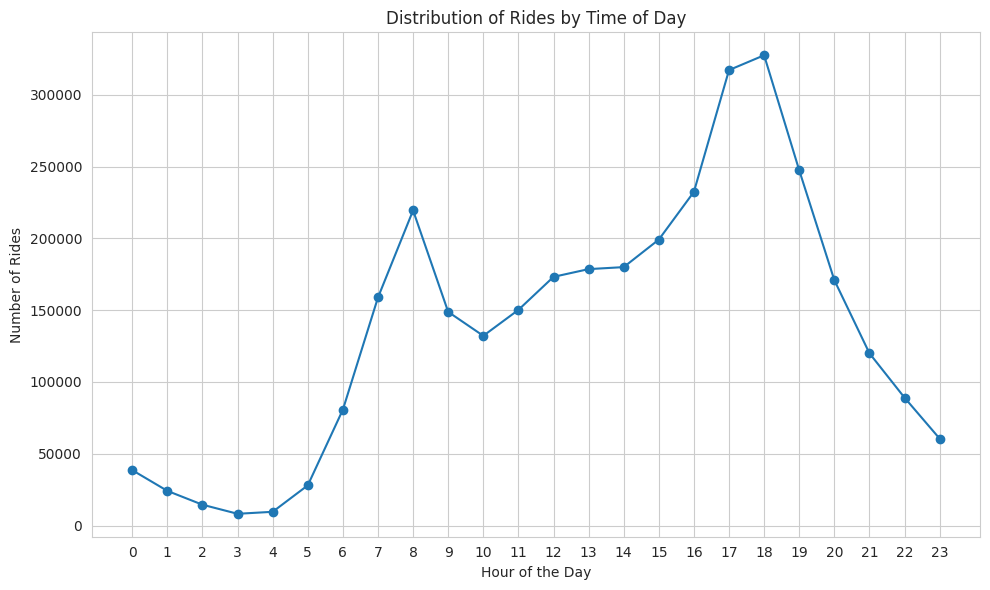

In [20]:
# As we need at what time do they ride, we first extract hour from the 'started_at' timestamp
objects = objects.withColumn('hour', hour('started_at'))

# next, we group by hour and count the number of rides
ride_hours = objects.groupBy('hour').count().orderBy('hour')

#convert to pandas
ride_hours_pd = ride_hours.toPandas()

# distribution of rides by time of day
plt.figure(figsize=(10, 6))
plt.plot(ride_hours_pd['hour'], ride_hours_pd['count'], marker='o', linestyle='-')
plt.title('Distribution of Rides by Time of Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.xticks(range(24)) 
plt.grid(True)
plt.tight_layout()
plt.show()

## 3. How far do they go? (Average distance traveled per ride)

In [21]:
# distance traveled using start and end coordinates. The multiplication by 111.32 is used to convert the difference in latitude and longitude coordinates from degrees to kilometers.
objects = objects.withColumn('distance_km', lit(111.32) * (col('end_lat') - col('start_lat')) + lit(111.32) * (col('end_lng') - col('start_lng')) * col('end_lat'))

# average distance traveled per ride
average_distance = objects.agg({'distance_km': 'avg'}).collect()[0][0]

print("Average distance traveled per ride:", average_distance, "km")

Average distance traveled per ride: 1.4009489129705215 km


## 4. Which stations are most popular? (Top start and end stations)

In [22]:
start_station_counts.show(10)   # top 10 starting stations
end_station_counts.show(10)     # top 10 ending stations

+--------------------+------+
|  start_station_name| count|
+--------------------+------+
|       Grove St PATH|189725|
|       Hamilton Park|100845|
|Hoboken Terminal ...| 98216|
|        Newport Pkwy| 95772|
|        Newport PATH| 92838|
|South Waterfront ...| 91683|
|    Marin Light Rail| 81822|
|Hoboken Terminal ...| 78547|
|          Harborside| 76942|
|  Liberty Light Rail| 70154|
+--------------------+------+
only showing top 10 rows



+--------------------+------+
|    end_station_name| count|
+--------------------+------+
|       Grove St PATH|215096|
|       Hamilton Park| 99721|
|        Newport Pkwy| 96176|
|Hoboken Terminal ...| 95092|
|        Newport PATH| 93611|
|South Waterfront ...| 93005|
|Hoboken Terminal ...| 81239|
|    Marin Light Rail| 81224|
|          Harborside| 76957|
|  Liberty Light Rail| 71860|
+--------------------+------+
only showing top 10 rows



## 5. What days of the week are most rides taken on? (Distribution of rides by day of the week)

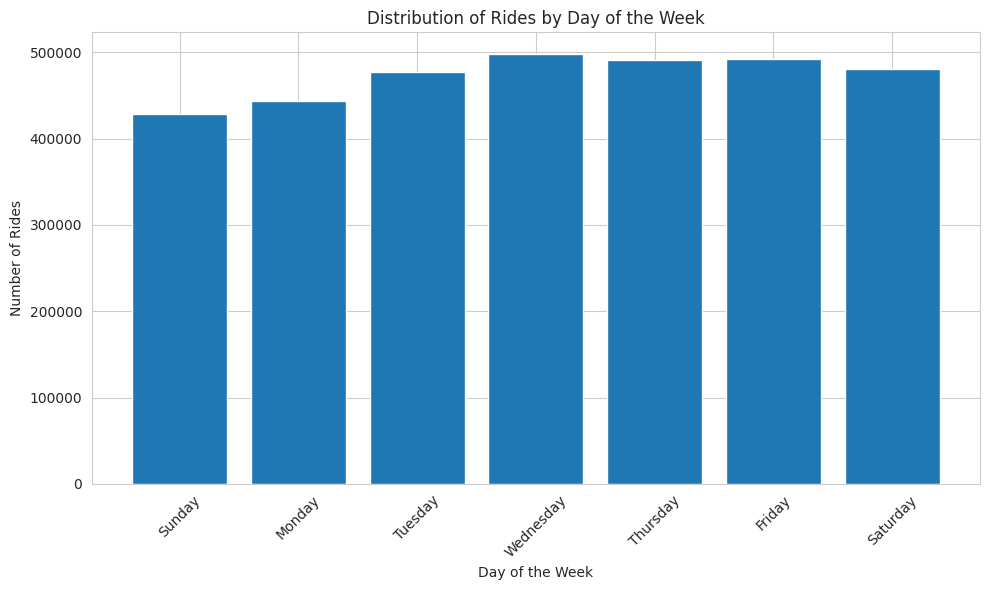

In [23]:
# Extract day of the week from the 'started_at' timestamp (1: Sunday, 2: Monday, ..., 7: Saturday)
objects = objects.withColumn('day_of_week', dayofweek('started_at'))

# Group by day of the week and count the number of rides
ride_days = objects.groupBy('day_of_week').count().orderBy('day_of_week')

# Convert DataFrame to Pandas DataFrame for plotting
ride_days_pd = ride_days.toPandas()

# Define the mapping of day of the week numbers to day names
day_names = {1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 5: 'Thursday', 6: 'Friday', 7: 'Saturday'}

# Map day of the week numbers to day names for better visualization
ride_days_pd['day_of_week'] = ride_days_pd['day_of_week'].map(day_names)

# Plot distribution of rides by day of the week
plt.figure(figsize=(10, 6))
plt.bar(ride_days_pd['day_of_week'], ride_days_pd['count'])
plt.title('Distribution of Rides by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Rides')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [24]:
end_time = datetime.now()
# Time required for data preprocessing and preparing the datafram
print("Time required for EDA:", (end_time - start_time))

Time required for EDA: 0:01:42.931969


#### Now we will start with forecasting. First, we will do feature engineering to consider the columns needed for our prophet model. Next, we will convert the dataframe into the form which we can feed it to phophet.

In [25]:
objects = objects.withColumn('started_at', date_format(col('started_at'), 'yyyy-MM-dd'))  
objects.printSchema()

root
 |-- started_at: string (nullable = true)
 |-- ended_at: timestamp (nullable = true)
 |-- start_station_name: string (nullable = true)
 |-- end_station_name: string (nullable = true)
 |-- start_lat: double (nullable = true)
 |-- start_lng: double (nullable = true)
 |-- end_lat: double (nullable = true)
 |-- end_lng: double (nullable = true)
 |-- total_ride_duration_seconds: long (nullable = true)
 |-- hour: integer (nullable = true)
 |-- distance_km: double (nullable = true)
 |-- day_of_week: integer (nullable = true)



In [26]:
# count number of rides on each start date
df = objects.groupBy('started_at').agg(count('*').alias('trips'))

# Sorting the dataFrame by date in ascending order
df = df.orderBy('started_at')

In [27]:
df.show()

+----------+-----+
|started_at|trips|
+----------+-----+
|2019-01-01|  431|
|2019-01-02|  827|
|2019-01-03|  860|
|2019-01-04|  900|
|2019-01-05|  308|
|2019-01-06|  510|
|2019-01-07|  820|
|2019-01-08|  887|
|2019-01-09|  847|
|2019-01-10|  791|
|2019-01-11|  712|
|2019-01-12|  440|
|2019-01-13|  378|
|2019-01-14|  780|
|2019-01-15|  914|
|2019-01-16|  864|
|2019-01-17|  827|
|2019-01-18|  704|
|2019-01-19|  410|
|2019-01-20|  253|
+----------+-----+
only showing top 20 rows



In [28]:
# convert the dataframe into needed form by prophet
df=df.withColumnRenamed('started_at', 'ds').withColumnRenamed('trips', 'y')
df.show()

+----------+---+
|        ds|  y|
+----------+---+
|2019-01-01|431|
|2019-01-02|827|
|2019-01-03|860|
|2019-01-04|900|
|2019-01-05|308|
|2019-01-06|510|
|2019-01-07|820|
|2019-01-08|887|
|2019-01-09|847|
|2019-01-10|791|
|2019-01-11|712|
|2019-01-12|440|
|2019-01-13|378|
|2019-01-14|780|
|2019-01-15|914|
|2019-01-16|864|
|2019-01-17|827|
|2019-01-18|704|
|2019-01-19|410|
|2019-01-20|253|
+----------+---+
only showing top 20 rows



## Visualization of Time Series Data

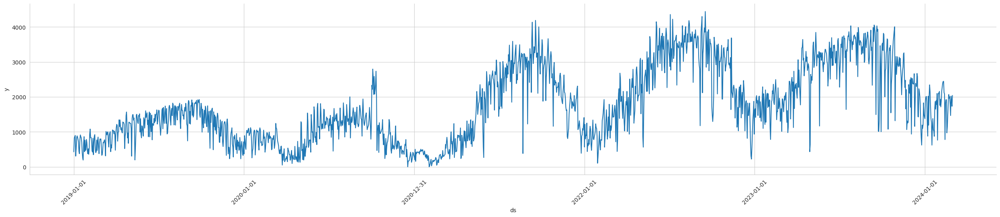

In [29]:
trips_df_pd=df.toPandas()
g = sns.relplot(x="ds", y="y", kind="line", data=trips_df_pd, aspect=5)

x_ticks = trips_df_pd['ds'][::365]   # to display every year
g.set(xticks=x_ticks)

plt.xticks(rotation=45)

plt.show()
g.fig.autofmt_xdate()

In [30]:
len(trips_df_pd)   # Records in the dataset

1885

In [31]:
trips_df_pd['ds'] = pd.to_datetime(trips_df_pd['ds'])

## Time Series Forecasting

### Preparing Dataset

In [32]:
# We first divide our dataset such that we take rides from 2024 as part of testing data and rest as training data

train_data = trips_df_pd[trips_df_pd['ds'].dt.year != 2024]
test_data = trips_df_pd[trips_df_pd['ds'].dt.year == 2024]

print("Training Dataset Size:", len(train_data))
print("Testing Dataset Size:", len(test_data))

Training Dataset Size: 1825
Testing Dataset Size: 60


In [33]:
train_data.head()   # Training data (2021-2023)

,ds,y
0,2019-01-01,431
1,2019-01-02,827
2,2019-01-03,860
3,2019-01-04,900
4,2019-01-05,308


In [34]:
train_data.tail() 

,ds,y
1820,2023-12-27,1095
1821,2023-12-28,1204
1822,2023-12-29,1830
1823,2023-12-30,1499
1824,2023-12-31,1425


In [35]:
test_data.head()   # Testing data (2024)

,ds,y
1825,2024-01-01,1377
1826,2024-01-02,1873
1827,2024-01-03,2002
1828,2024-01-04,2015
1829,2024-01-05,1826


In [36]:
test_data.tail()

,ds,y
1880,2024-02-25,1469
1881,2024-02-26,2025
1882,2024-02-27,1900
1883,2024-02-28,1733
1884,2024-02-29,2042


### Training Prophet Model

In [37]:
model=Prophet()
model.fit(train_data)

18:05:19 - cmdstanpy - INFO - Chain [1] start processing
18:05:19 - cmdstanpy - INFO - Chain [1] done processing


### Forcasting using Trained Prophet Model

In [38]:
future = model.make_future_dataframe(periods=60)
forecast = model.predict(future)

In [39]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-01-01,1301.581514,-191.583884,1004.389001,1301.581514,1301.581514,-873.012216,-873.012216,-873.012216,21.990094,21.990094,21.990094,-895.002310,-895.002310,-895.002310,0.0,0.0,0.0,428.569298
1,2019-01-02,1300.716787,-102.096015,1097.341857,1300.716787,1300.716787,-799.043836,-799.043836,-799.043836,89.628945,89.628945,89.628945,-888.672781,-888.672781,-888.672781,0.0,0.0,0.0,501.672950
2,2019-01-03,1299.852060,-151.107739,1112.118119,1299.852060,1299.852060,-825.363186,-825.363186,-825.363186,54.970967,54.970967,54.970967,-880.334153,-880.334153,-880.334153,0.0,0.0,0.0,474.488873
3,2019-01-04,1298.987332,-97.939090,1055.789795,1298.987332,1298.987332,-799.443012,-799.443012,-799.443012,70.769345,70.769345,70.769345,-870.212357,-870.212357,-870.212357,0.0,0.0,0.0,499.544320
4,2019-01-05,1298.122605,-123.971562,1100.877442,1298.122605,1298.122605,-826.213282,-826.213282,-826.213282,32.352709,32.352709,32.352709,-858.565992,-858.565992,-858.565992,0.0,0.0,0.0,471.909323


In [40]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
1880,2024-02-25,2662.559226,1255.911396,2405.987487,2653.758840,2671.255057,-827.897723,-827.897723,-827.897723,-155.215103,-155.215103,-155.215103,-672.682620,-672.682620,-672.682620,0.0,0.0,0.0,1834.661503
1881,2024-02-26,2662.728371,1255.895437,2462.664126,2653.433524,2671.693880,-780.070968,-780.070968,-780.070968,-114.496958,-114.496958,-114.496958,-665.574010,-665.574010,-665.574010,0.0,0.0,0.0,1882.657403
1882,2024-02-27,2662.897517,1409.817502,2636.970808,2653.031072,2672.206421,-637.395262,-637.395262,-637.395262,21.990094,21.990094,21.990094,-659.385356,-659.385356,-659.385356,0.0,0.0,0.0,2025.502254
1883,2024-02-28,2663.066662,1512.446655,2740.453055,2653.188218,2673.027928,-564.504224,-564.504224,-564.504224,89.628945,89.628945,89.628945,-654.133169,-654.133169,-654.133169,0.0,0.0,0.0,2098.562438
1884,2024-02-29,2663.235807,1514.290233,2700.775587,2653.082053,2673.516816,-594.832714,-594.832714,-594.832714,54.970967,54.970967,54.970967,-649.803681,-649.803681,-649.803681,0.0,0.0,0.0,2068.403093


'ds': represents the dates for which the forecasted values are provided. \
'yhat': contains the forecasted values (predictions) for each corresponding date in the 'ds' column. \
'yhat_lower': contains the lower bound of the uncertainty interval for each forecasted value. It represents the lower bound of the prediction's confidence interval. \
'yhat_upper': contains the upper bound of the uncertainty interval for each forecasted value. It represents the upper bound of the prediction's confidence interval.

In [41]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1880,2024-02-25,1834.661503,1255.911396,2405.987487
1881,2024-02-26,1882.657403,1255.895437,2462.664126
1882,2024-02-27,2025.502254,1409.817502,2636.970808
1883,2024-02-28,2098.562438,1512.446655,2740.453055
1884,2024-02-29,2068.403093,1514.290233,2700.775587


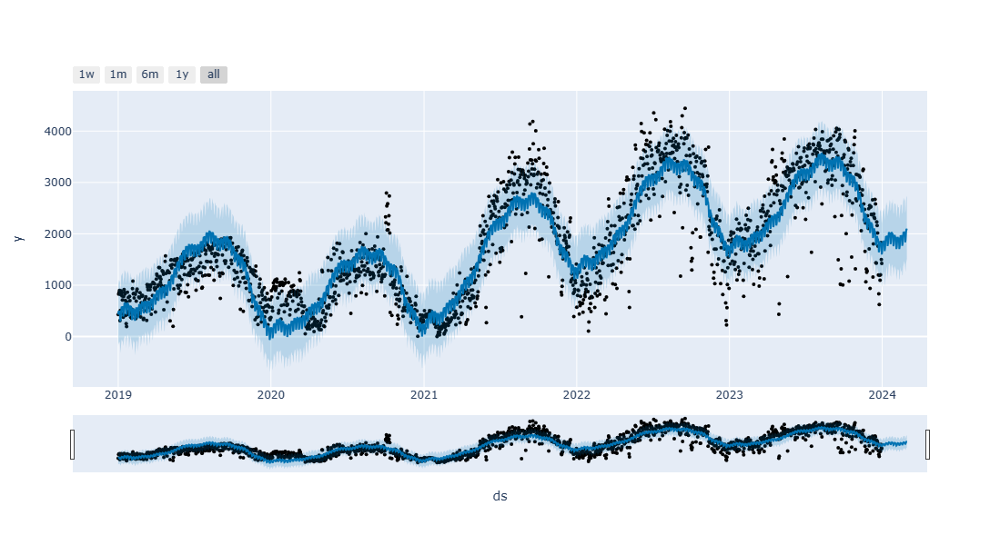

In [42]:
# This plot shows the forecast generated by the Prophet model.
plot_plotly(model ,forecast)

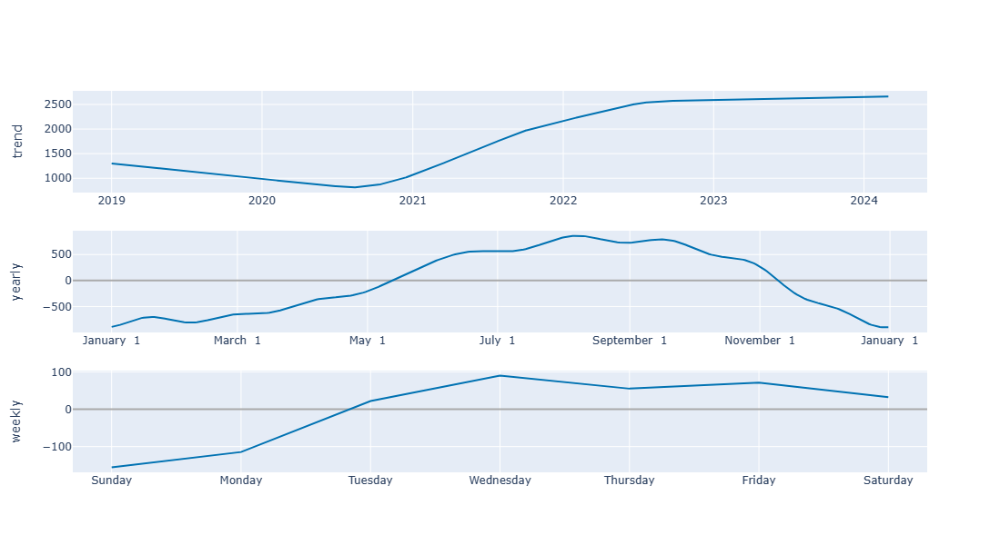

In [43]:
# This plot shows the yearly, weakly and general trend generated by the Prophet model.
plot_components_plotly(model, forecast)

In [44]:
# These are the predicted values for the year 2024.
predictions = forecast[forecast['ds'].dt.year == 2024]['yhat']
predictions

1825    1642.511449
1826    1784.963919
1827    1860.628056
1828    1835.838289
1829    1863.096854
1830    1837.453055
1831    1663.669326
1832    1718.866120
1833    1870.201593
1834    1952.733037
1835    1932.692730
1836    1962.528370
1837    1937.283462
1838    1761.763284
1839    1813.178518
1840    1958.822494
1841    2033.929123
1842    2004.944239
1843    2024.560663
1844    1988.092483
1845    1800.634341
1846    1839.697986
1847    1972.882213
1848    2035.723457
1849    1994.959948
1850    2003.559904
1851    1957.089448
1852    1760.866175
1853    1792.590776
1854    1920.012951
1855    1978.778975
1856    1935.693883
1857    1943.748792
1858    1898.489054
1859    1705.169148
1860    1741.386664
1861    1874.751553
1862    1940.737891
1863    1905.951010
1864    1923.160392
1865    1887.673847
1866    1704.498738
1867    1750.982431
1868    1894.487981
1869    1970.252132
1870    1944.658332
1871    1970.275013
1872    1942.234512
1873    1765.398305
1874    1817.000620


## Evaluation

In [45]:
# Calculate Root Mean Squared Error (RMSE)
mse = mean_squared_error(y_true=test_data['y'], y_pred=predictions)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

Root Mean Squared Error (RMSE): 480.4881727558103


In [46]:
# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_true=test_data['y'],  y_pred=predictions)
print("Mean Absolute Error (MAE):", mae)

Mean Absolute Error (MAE): 357.0439117470143


In [47]:
# Calculate Mean Absolute Percentage Error (MAPE)
mape = mean_absolute_percentage_error(y_true=test_data['y'], y_pred=predictions)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Absolute Percentage Error (MAPE): 0.2972426167806985


#### Plot comparing the actual and predicted values for the test data.

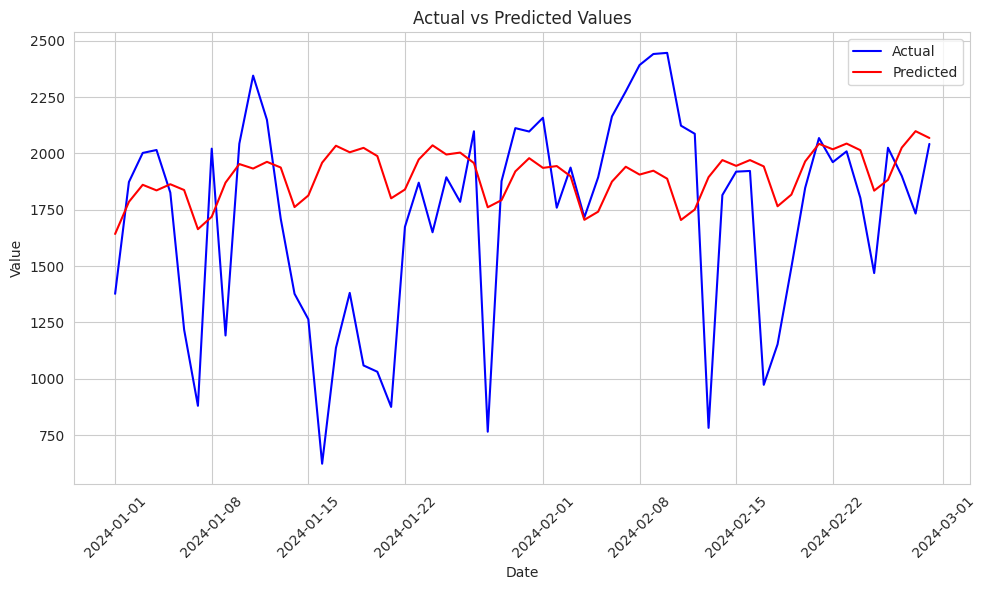

In [48]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(test_data['ds'], test_data['y'], label='Actual', color='blue')
plt.plot(test_data['ds'], predictions, label='Predicted', color='red')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.xticks(rotation=45)  
plt.legend()
plt.tight_layout() 
plt.show()


# Adding Holidays/Special Events

In this section, we will see how adding holidays/Events effects the forecasted results

In [49]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar

cal = calendar()

# Get the holidays
holidays = cal.holidays(start='2019-01-01', end='2024-02-29',return_name=True)

# Print the list of holidays
print("US Federal Holidays from 2019-2024:")
print(holidays)

US Federal Holidays from 2019-2024:
2019-01-01                          New Year's Day
2019-01-21     Birthday of Martin Luther King, Jr.
2019-02-18                   Washington's Birthday
2019-05-27                            Memorial Day
2019-07-04                        Independence Day
2019-09-02                               Labor Day
2019-10-14                            Columbus Day
2019-11-11                            Veterans Day
2019-11-28                        Thanksgiving Day
2019-12-25                           Christmas Day
2020-01-01                          New Year's Day
2020-01-20     Birthday of Martin Luther King, Jr.
2020-02-17                   Washington's Birthday
2020-05-25                            Memorial Day
2020-07-03                        Independence Day
2020-09-07                               Labor Day
2020-10-12                            Columbus Day
2020-11-11                            Veterans Day
2020-11-26                        Thanksgiving

In [50]:
holiday_df = pd.DataFrame(data=holidays,columns=['holiday'])

In [51]:
holiday_df = holiday_df.reset_index().rename(columns={'index':'ds'})

In [52]:
holiday_df

,ds,holiday
0,2019-01-01,New Year's Day
1,2019-01-21,"Birthday of Martin Luther King, Jr."
2,2019-02-18,Washington's Birthday
3,2019-05-27,Memorial Day
4,2019-07-04,Independence Day
5,2019-09-02,Labor Day
6,2019-10-14,Columbus Day
7,2019-11-11,Veterans Day
8,2019-11-28,Thanksgiving Day
9,2019-12-25,Christmas Day


In [53]:
COVID_Pandemic = pd.DataFrame ({
    'ds':pd.date_range('2020-03-15','2023-03-01'),
     'holiday':'COVID'
})

COVID_Pandemic

,ds,holiday
0,2020-03-15,COVID
1,2020-03-16,COVID
2,2020-03-17,COVID
3,2020-03-18,COVID
4,2020-03-19,COVID
...,...,...
1077,2023-02-25,COVID
1078,2023-02-26,COVID
1079,2023-02-27,COVID
1080,2023-02-28,COVID


In [54]:
holiday_df = pd.concat((holiday_df,COVID_Pandemic))
holiday_df

,ds,holiday
0,2019-01-01,New Year's Day
1,2019-01-21,"Birthday of Martin Luther King, Jr."
2,2019-02-18,Washington's Birthday
3,2019-05-27,Memorial Day
4,2019-07-04,Independence Day
...,...,...
1077,2023-02-25,COVID
1078,2023-02-26,COVID
1079,2023-02-27,COVID
1080,2023-02-28,COVID


In [55]:
model_with_holiday=Prophet(holidays=holiday_df)   # adding holiday factor to prophet
model_with_holiday.fit(train_data)

18:05:22 - cmdstanpy - INFO - Chain [1] start processing
18:05:23 - cmdstanpy - INFO - Chain [1] done processing


In [56]:
future = model_with_holiday.make_future_dataframe(periods=60)  #makeing predictions
forecast = model_with_holiday.predict(future)

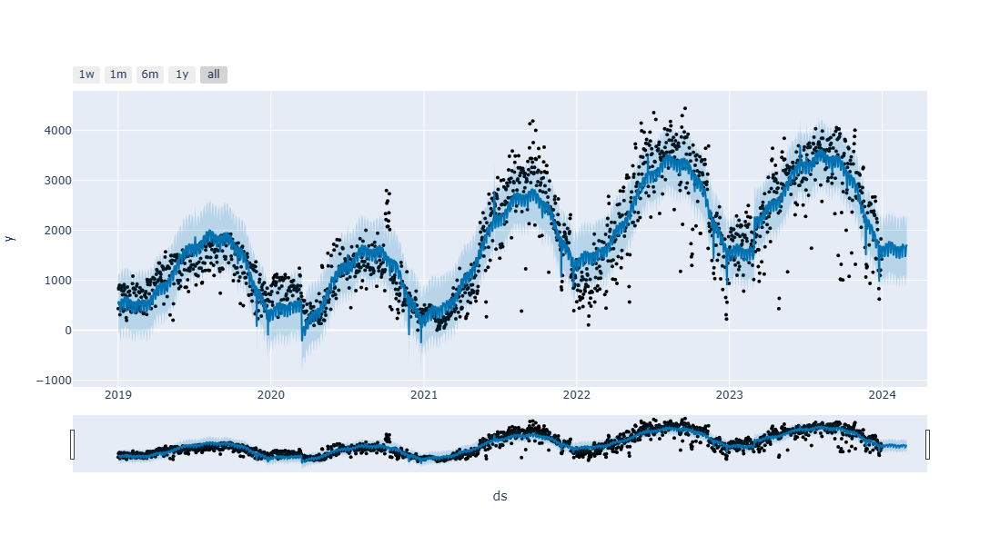

In [57]:
plot_plotly(model_with_holiday ,forecast)

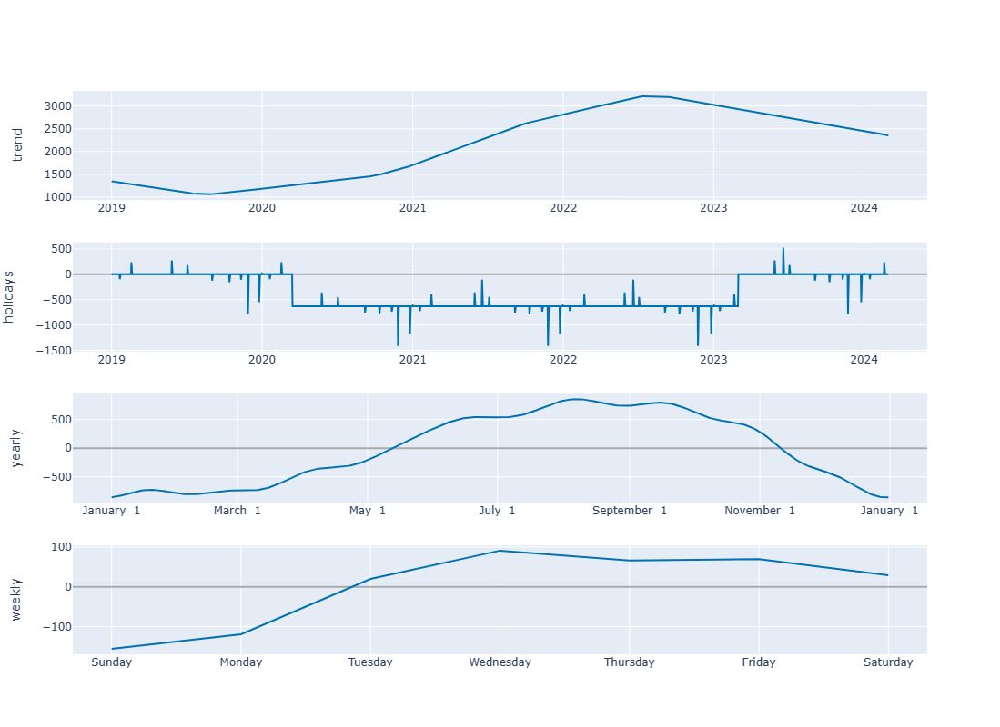

In [58]:
plot_components_plotly(model_with_holiday, forecast)

In [59]:
predictions = forecast[forecast['ds'].dt.year == 2024]['yhat']
predictions

1825    1488.160036
1826    1612.883887
1827    1687.010362
1828    1667.022646
1829    1676.447765
1830    1643.074981
1831    1465.987330
1832    1511.148582
1833    1659.061836
1834    1738.882238
1835    1722.839246
1836    1734.435225
1837    1701.475095
1838    1523.097102
1839    1471.831727
1840    1708.889149
1841    1783.005317
1842    1760.123006
1843    1763.953909
1844    1722.529122
1845    1535.224082
1846    1568.337737
1847    1702.742355
1848    1767.986693
1849    1736.708223
1850    1732.821440
1851    1684.537253
1852    1491.383798
1853    1519.782252
1854    1650.694128
1855    1713.722836
1856    1681.525232
1857    1678.000194
1858    1631.309205
1859    1440.899244
1860    1473.081493
1861    1608.682256
1862    1677.148771
1863    1650.965510
1864    1653.847884
1865    1613.768173
1866    1429.983859
1867    1468.621683
1868    1610.333729
1869    1684.408027
1870    1663.189184
1871    1670.275810
1872    1633.549499
1873    1452.205435
1874    1730.402905


## Evaluation

In [60]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_true=test_data['y'], y_pred=predictions)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

print("Root Mean Squared Error (RMSE):", rmse)

Root Mean Squared Error (RMSE): 459.7510702647261


In [61]:
# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_true=test_data['y'],  y_pred=predictions)
print("Mean Absolute Error (MAE):", mae)

Mean Absolute Error (MAE): 391.78275471238453


In [62]:
# Calculate Mean Absolute Percentage Error (MAPE)
mape = mean_absolute_percentage_error(y_true=test_data['y'], y_pred=predictions)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Absolute Percentage Error (MAPE): 0.27651593399119545


#### Plot comparing the actual and predicted values for the test data.

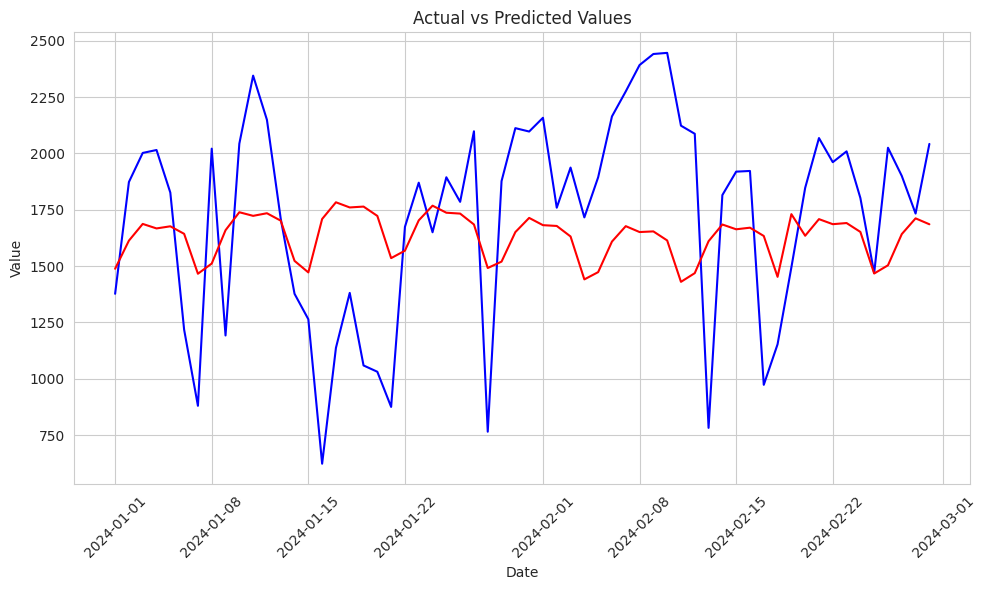

In [63]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values with dates
plt.figure(figsize=(10, 6))
plt.plot(test_data['ds'], test_data['y'], label='Actual', color='blue')
plt.plot(test_data['ds'], predictions, label='Predicted', color='red')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()


## Adding Weather Effect

In [64]:
weather_object = spark.read.csv('data/weather.csv', sep=',',inferSchema=True, header=True)
weather_object=weather_object.select("DATE","PRCP","SNOW")
weather_object

DataFrame[DATE: date, PRCP: double, SNOW: double]

In [65]:
start_date = '2019-01-01'
end_date = '2024-02-29'
weather_df = weather_object.filter((col('DATE') >= start_date) & (col('DATE') <= end_date))
weather_object

DataFrame[DATE: date, PRCP: double, SNOW: double]

In [66]:
# Merge trip data with weather data
weather_df = weather_df.withColumn('DATE', weather_df['DATE'].cast('timestamp'))
trips_df_spark = spark.createDataFrame(trips_df_pd)
merged_df = trips_df_spark.join(weather_df, trips_df_spark['ds'] == weather_df['DATE'], how='left')
merged_df = merged_df.drop('DATE')
merged_df_pd=merged_df.toPandas()
merged_df_pd['ds'] = pd.to_datetime(merged_df_pd['ds'])
merged_df_pd

,ds,y,PRCP,SNOW
0,2019-01-01,431,15.0,0.0
1,2019-01-02,827,0.0,0.0
2,2019-01-03,860,0.0,0.0
3,2019-01-04,900,0.0,0.0
4,2019-01-05,308,127.0,0.0
...,...,...,...,...
1880,2024-02-25,1469,0.0,0.0
1881,2024-02-26,2025,3.0,0.0
1882,2024-02-27,1900,132.0,0.0
1883,2024-02-28,1733,43.0,0.0


In [67]:
train_data = merged_df_pd[merged_df_pd['ds'].dt.year != 2024]
test_data = merged_df_pd[merged_df_pd['ds'].dt.year == 2024]

print("Training Dataset Size:", len(train_data))
print("Testing Dataset Size:", len(test_data))

Training Dataset Size: 1825
Testing Dataset Size: 60


In [68]:
model_weather=Prophet(holidays=holiday_df)  # adding holidays effects
model_weather.add_regressor('PRCP')         # adding precipitation effect
model_weather.add_regressor('SNOW')         # adding snow effect
model_weather.fit(train_data)

18:05:28 - cmdstanpy - INFO - Chain [1] start processing
18:05:29 - cmdstanpy - INFO - Chain [1] done processing


In [69]:
def weather_PRCP(date):
    date = date.to_pydatetime().date()
    
    # Check if the date exists in historical weather data
    if weather_df.filter(weather_df['DATE'] == date).count() > 0: 
        return weather_df.filter(weather_df['DATE'] == date).select('PRCP').collect()[0]['PRCP'] #fetch the corresponding precipitate value
    else:
        return 0

def weather_SNOW(date):
    date = date.to_pydatetime().date()
    
    # Check if the date exists in historical weather data
    if weather_df.filter(weather_df['DATE'] == date).count() > 0: 
        return weather_df.filter(weather_df['DATE'] == date).select('SNOW').collect()[0]['SNOW'] #fetch the corresponding snow value
    else:
        return 0

In [70]:
future = model_weather.make_future_dataframe(periods=60)  #makeing predictions
future['PRCP'] = future['ds'].apply(weather_PRCP)
future['SNOW'] = future['ds'].apply(weather_SNOW)
forecast = model_weather.predict(future)

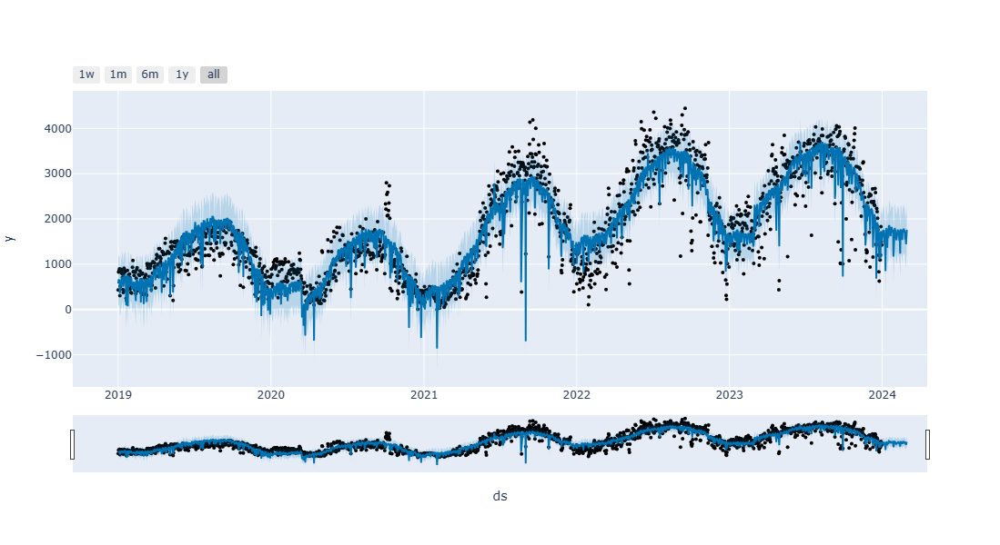

In [71]:
plot_plotly(model_weather ,forecast)

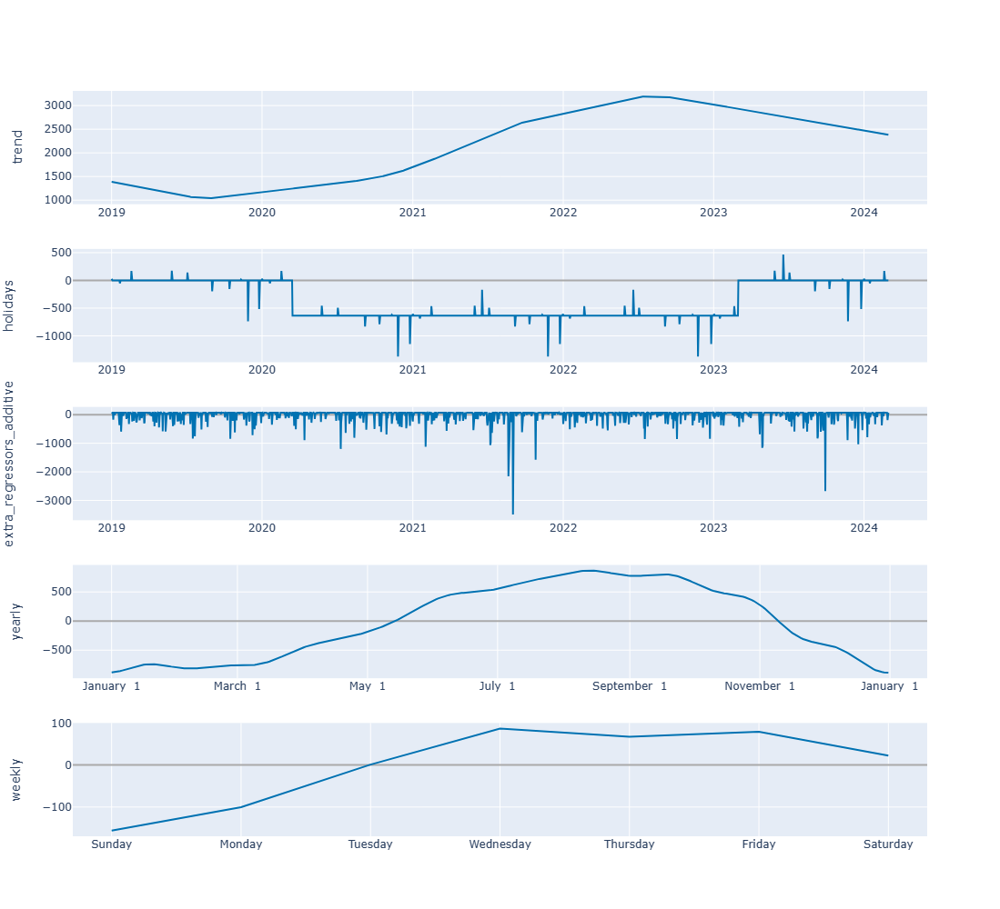

In [72]:
plot_components_plotly(model_weather, forecast)

In [73]:
predictions = forecast[forecast['ds'].dt.year == 2024]['yhat']
predictions

1825    1571.293935
1826    1662.831302
1827    1750.949302
1828    1736.351766
1829    1753.971590
1830    1496.308487
1831    1414.667146
1832    1599.888179
1833     846.205619
1834    1696.191794
1835    1797.234515
1836    1778.730705
1837    1364.396061
1838    1599.570006
1839    1581.926082
1840    1605.287049
1841    1858.730529
1842    1842.412537
1843    1828.288229
1844    1798.442247
1845    1618.365386
1846    1671.205218
1847    1742.895160
1848    1823.204453
1849    1703.441843
1850    1733.707438
1851    1764.249600
1852    1168.220392
1853    1600.248504
1854    1719.456136
1855    1797.382027
1856    1771.129261
1857    1616.449336
1858    1713.481100
1859    1529.843411
1860    1581.322703
1861    1679.397571
1862    1762.491375
1863    1741.913647
1864    1752.803912
1865    1696.376016
1866    1518.794914
1867    1576.091346
1868    1234.852460
1869    1767.542266
1870    1751.164636
1871    1765.492516
1872    1584.159407
1873    1535.835700
1874    1763.161996


## Evaluation

In [74]:
# Calculate Root Mean Squared Error (RMSE)
mse = mean_squared_error(y_true=test_data['y'], y_pred=predictions)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

Root Mean Squared Error (RMSE): 414.6198175368158


In [75]:
# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_true=test_data['y'],  y_pred=predictions)
print("Mean Absolute Error (MAE):", mae)

Mean Absolute Error (MAE): 353.8383274168347


In [76]:
# Calculate Mean Absolute Percentage Error (MAPE)
mape = mean_absolute_percentage_error(y_true=test_data['y'], y_pred=predictions)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Absolute Percentage Error (MAPE): 0.24959162351628156


#### Plot comparing the actual and predicted values for the test data.

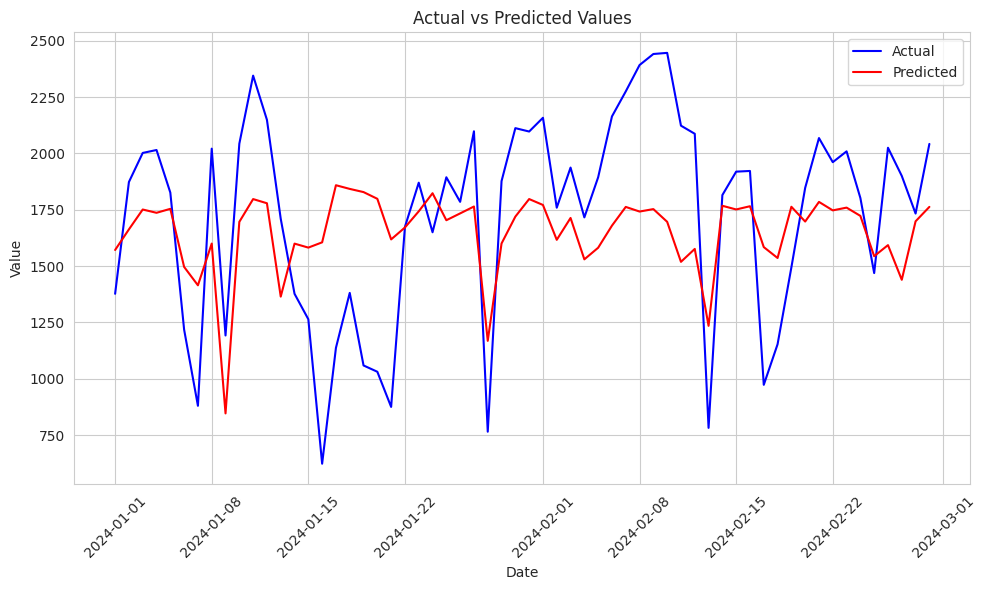

In [77]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(test_data['ds'], test_data['y'], label='Actual', color='blue')
plt.plot(test_data['ds'], predictions, label='Predicted', color='red')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.xticks(rotation=45)  
plt.legend()
plt.tight_layout() 
plt.show()